<a href="https://colab.research.google.com/github/savinalintang/Proyek2-WebVaksin/blob/master/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


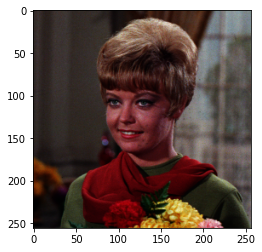

In [2]:
import cv2 as cv 
from google.colab.patches import cv2_imshow 
from skimage import io 
import matplotlib.pyplot as plt 
import numpy as np 

img_f = cv.imread('/content/drive/MyDrive/Images/female.tiff')
img_rgb = cv.cvtColor(img_f,cv.COLOR_BGR2RGB) # konversi channel BGR -> RGB
plt.imshow(img_rgb)

1. Buat Gamma Correction sesuai dengan petunjuk berikut

Gamma Correction pada citra
---------------------------
Masukkan nilai Gamma: 3


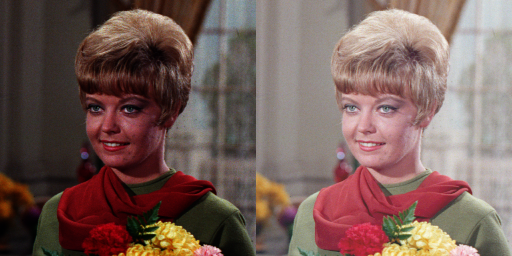

In [3]:
print('Gamma Correction pada citra')
print('---------------------------')
try: 
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.cvtColor(img_rgb,cv.COLOR_BGR2RGB)
gamma_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
     gamma_image[y,x,c] = np.clip(255 * pow(original[y,x,c] / 255, (1 / gamma)), 0, 255)
     
final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

2. Buat Simulasi Image Depth

Simulasi Image Depth
--------------------
Masukkan nilai Bit Depth: 4


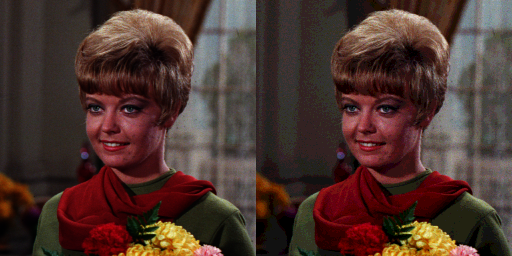

In [4]:
original = cv.cvtColor(img_rgb,cv.COLOR_BGR2RGB)
gamma_image = np.zeros(original.shape, original.dtype)

print('Simulasi Image Depth')
print('--------------------')
try:
  bd = float(input('Masukkan nilai Bit Depth: '))
except ValueError:
  print('Error, not a number')

bit = 2**bd
level = 255 / (bit - 1)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
     gamma_image[y,x,c] = np.clip(round(original[y,x,c] / level) * level, 0, 255);

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

3. Buat modul Average Denoising

Nilai PSNR adalah 27.527403764933133 (dB)


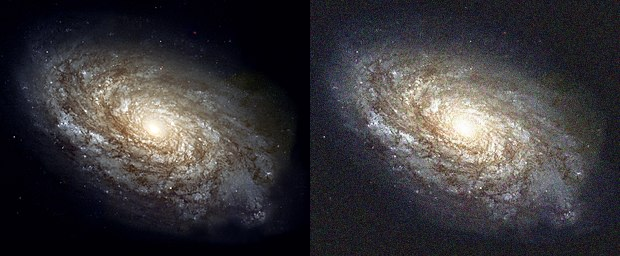

In [5]:
# Citra 5

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/Images/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Images/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 4 
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed): 
    mse = np.mean((original - compressed) ** 2) 
    if(mse == 0):   

      return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse)) 
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.49822386835433 (dB)


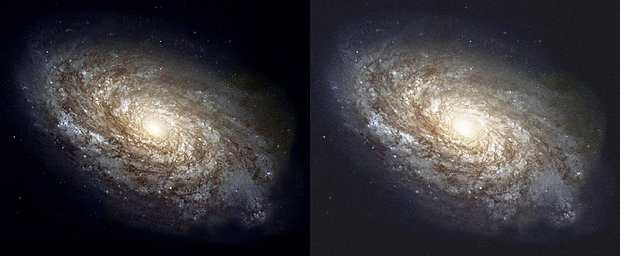

In [6]:
# Citra 50

dst = cv_img[0]
noise_number = 49
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.517764046757858 (dB)


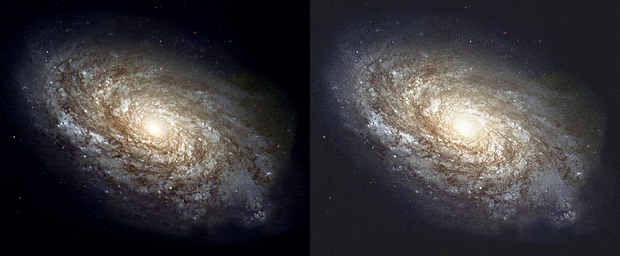

In [7]:
# Citra 80

dst = cv_img[0]
noise_number = 79
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.514354540474237 (dB)


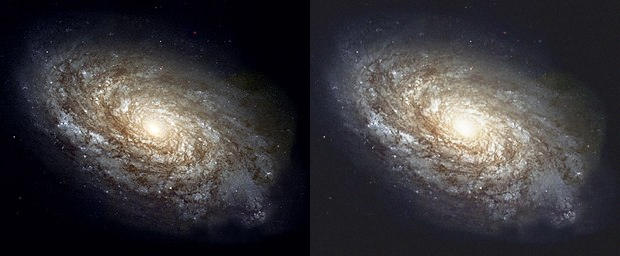

In [8]:
# Citra 100

dst = cv_img[0]
noise_number = 99
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Dari hasil PSNR yang anda catat pada tabel diatas, kesimpulan yang dapat diambil adalah
- 

4. Buat image masking untuk image berikut. Image kiri adalah image asli (images/tank.tiff),
image tengah adalah mask, sedangkan image kanan adalah hasilnya:

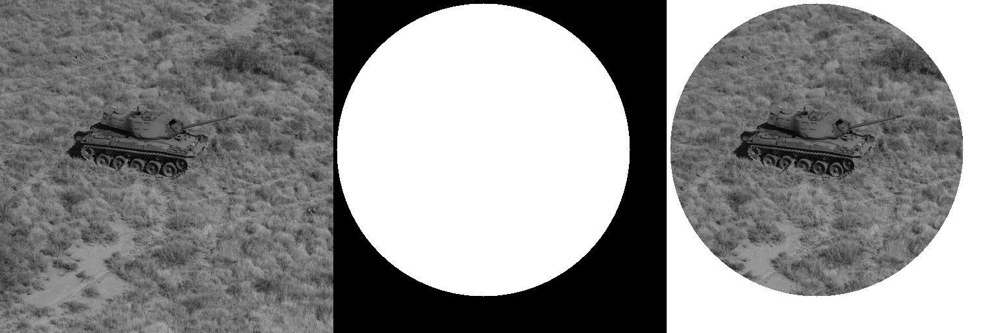

In [9]:
img = cv.imread('/content/drive/MyDrive/Images/tank.tiff')

mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.circle(mask, (230,230), 225, (255,255,255), -1)

result = img | ~mask

tank_frame = cv.hconcat((img,mask, result))
cv2_imshow(tank_frame)

5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini.
Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu

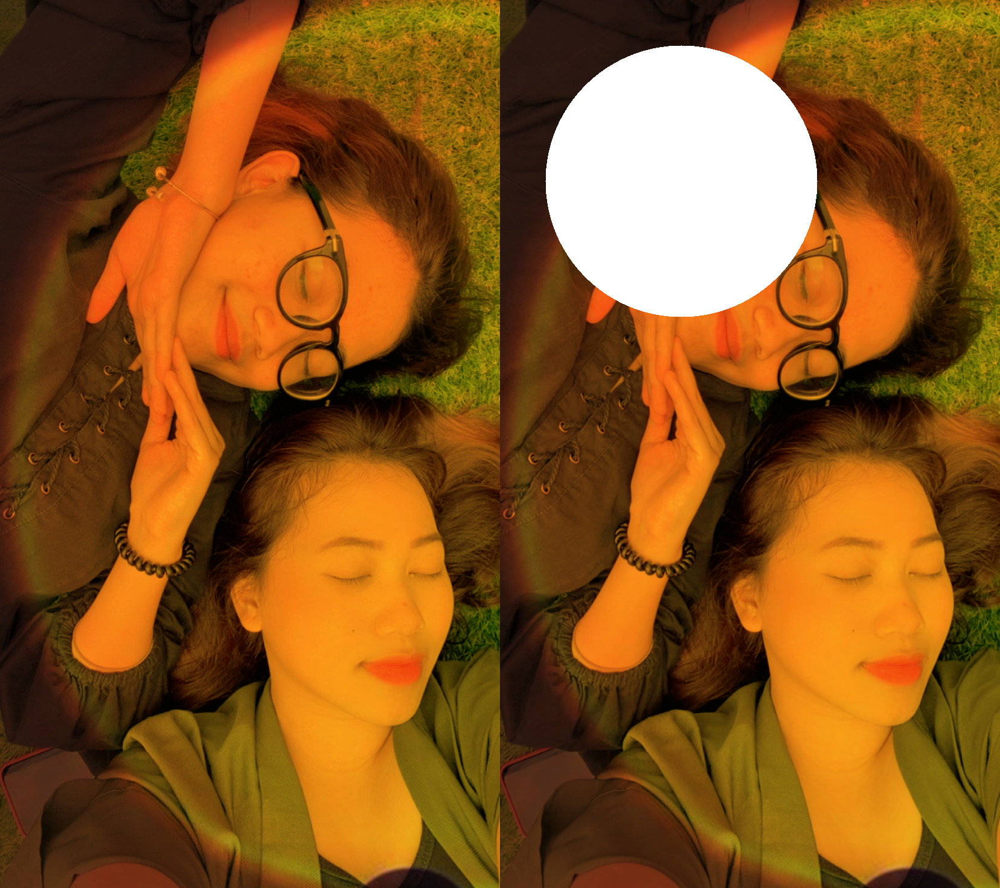

In [10]:
# OR

img_savina = cv.imread('/content/drive/MyDrive/Images/fotoku.jpg')

mask = np.zeros(img_savina.shape, dtype=np.uint8)
mask = cv.circle(mask, (300,300), 225, (255,255,255), -1)

result = img_savina | mask

savina_frame = cv.hconcat((img_savina, result))
cv2_imshow(savina_frame)

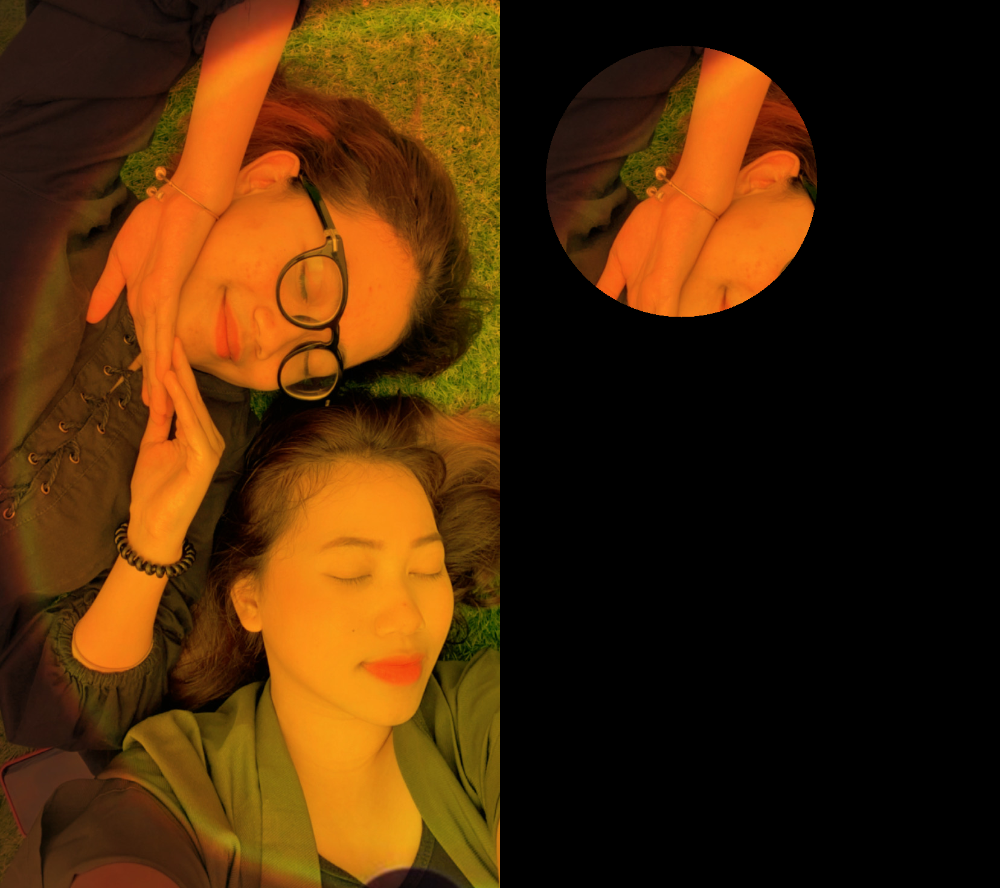

In [11]:
# AND

img_savina = cv.imread('/content/drive/MyDrive/Images/fotoku.jpg')

mask = np.zeros(img_savina.shape, dtype=np.uint8)
mask = cv.circle(mask, (300,300), 225, (255,255,255), -1)

result = img_savina & mask

savina_frame = cv.hconcat((img_savina, result))
cv2_imshow(savina_frame)

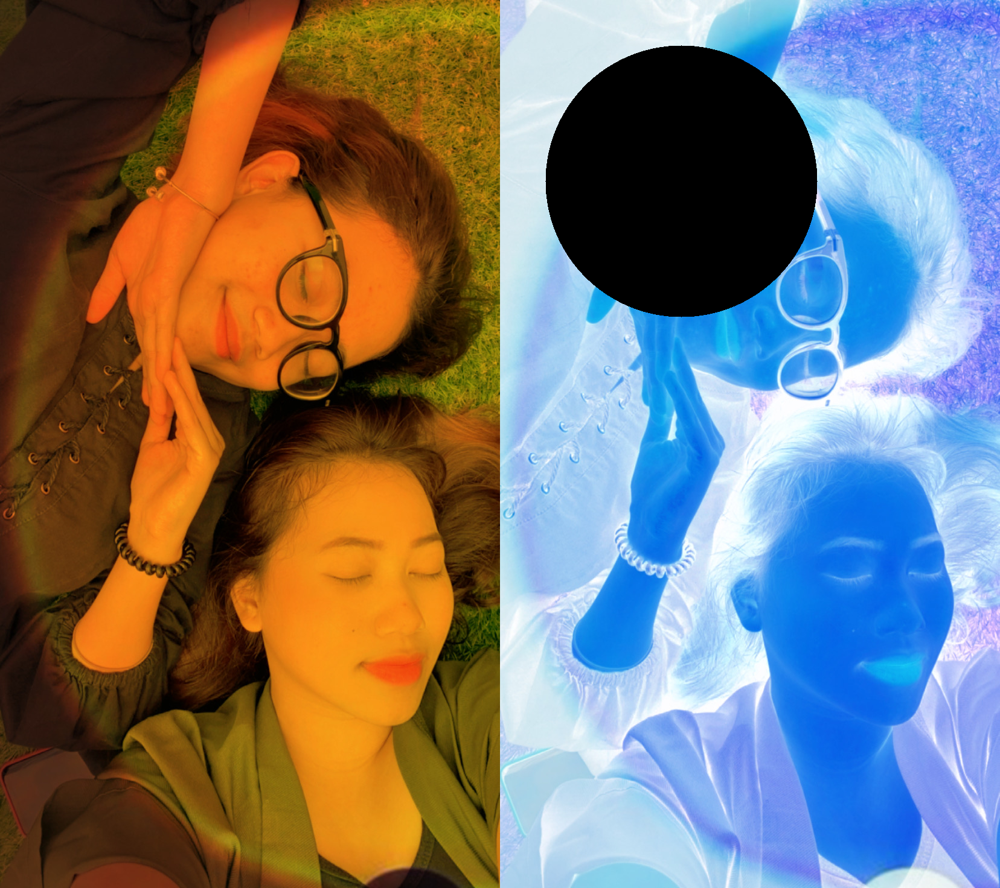

In [12]:
# NOT


img_savina = cv.imread('/content/drive/MyDrive/Images/fotoku.jpg')

mask = np.zeros(img_savina.shape, dtype=np.uint8)
mask = cv.circle(mask, (300,300), 225, (255,255,255), -1)

result = ~img_savina & ~mask

savina_frame = cv.hconcat((img_savina, result))
cv2_imshow(savina_frame)